<a href="https://colab.research.google.com/github/rohamvo/OTT-flatform-analysis/blob/main/Project_Topic_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3-1) 리뷰 데이터 수집

# letterboxd, metacritics
정적 웹 크롤링.
원하는 웹 페이지의 html 문서를 파싱, 사이트 구조에 맞춰 필요한 데이터 선택.
리뷰 텍스트 데이터와 별점 수집, excel과 csv로 저장.


In [ ]:
!pip install fake_useragent

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 KB 2.8 MB/s eta 0:00:00


In [ ]:
import requests
from fake_useragent import UserAgent
from bs4 import BeautifulSoup
import re
import pandas as pd


def review_rating_crawler(title):
  dft_url_list = []
  dft_text_list = []
  rating_list = []
  pattern = r'rated-(\d+)'
  max_page = 256

  url = f"https://letterboxd.com/film/{title}/reviews/by/activity/page/1"
  headers = {"user-agent": UserAgent().chrome}
  response = requests.get(url, headers=headers)
  page = response.content
  soup = BeautifulSoup(page, 'html.parser')
  if soup.select_one('li.js-route-reviews > a').get('title') is not None:
    review_count = int(soup.select_one('li.js-route-reviews > a').get('title').split()[0].replace(',', ''))
    
    for i in range(1, min((review_count//12)+1, max_page)):
      url = f"https://letterboxd.com/film/{title}/reviews/by/activity/page/{i}"
      headers = {"user-agent": UserAgent().chrome}
      response = requests.get(url, headers=headers)
      page = response.content
      soup = BeautifulSoup(page, 'html.parser')
          
      div_list = soup.select("div.body-text.-prose.collapsible-text")
      for div in div_list:
        url = div.get('data-full-text-url')
        dft_url_list.append(url)
      
      tags = soup.select("div.attribution-block > p")
      for tag in tags:
        if tag.find('span', {'class': 'rating'}):
          span = tag.find('span', {'class': 'rating'})
          rating = re.findall(pattern, str(span))        
          rating_list.append(int(rating[0]))
        else:
          rating_list.append(float('nan'))
                  
    for i in dft_url_list:
      url = 'https://letterboxd.com' + i
      headers = {"user-agent": UserAgent().chrome}
      response = requests.get(url, headers=headers)
      page = response.content
      soup = BeautifulSoup(page, 'html.parser')
      dft_text_list.append(soup.text.strip())
    return dft_text_list, rating_list
  
  else:
    return []


# **imdb**

동적 웹 크롤링.
url만으로는 추가되는 데이터를 가져올 수 없는 형태의 웹 페이지.
selenium으로 chromedriver를 제어하여 버튼을 누르는 등 직접 조작으로 사전준비.
이후는 driver.page_source로 html 문서를 파싱해서, 기존 정적 웹 크롤링 방식대로 처리.
리뷰 텍스트 데이터와 별점 수집, excel과 csv로 저장.

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.by import By
from selenium.common.exceptions import ElementNotInteractableException
from selenium.webdriver.chrome.service import Service as ChromeDriverService
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import TimeoutException
import time

from fake_useragent import UserAgent
from bs4 import BeautifulSoup
import requests
import re

service = ChromeDriverService(executable_path='./chromedriver')



def selenium_crawler4(title_ticker):
    review_list = []
    rating_list = []
    
    driver = webdriver.Chrome(service=service)
    wait = WebDriverWait(driver, 10)
    url = f'https://www.imdb.com/title/{title_ticker}/reviews?sort=totalVotes&dir=desc&ratingFilter=0'
    driver.get(url)
    
    for i in range(20):
        try:
            button = wait.until(EC.element_to_be_clickable((By.XPATH, r'//*[@id="load-more-trigger"]'))) # 버튼이 클릭 가능해질 때까지 기다려라
            button.click()
            
        except (ElementNotInteractableException, TimeoutException):
            break
    
    page = driver.page_source
    soup = BeautifulSoup(page, 'html.parser')
            
    review_list = [div.text.strip() for div in soup.select('div.text.show-more__control')]
    
    tags = soup.find_all(class_="lister-item-content")

    for tag in tags:
        if tag.find(class_="ipl-ratings-bar"):
            rating = tag.select_one('div.ipl-ratings-bar > span > span:nth-child(2)')
            rating_list.append(int(rating.text))
        else:
            rating_list.append(float('nan'))

    driver.quit()
    return review_list, rating_list

# 크롤링완료. 데이터프레임으로 만들어서 분석시작

In [ ]:
import pandas as pd

In [ ]:
imdb_df = pd.read_csv('/content/drive/MyDrive/2주프로젝트/imdb_reviews_ratings_1-15', index_col = 0)
letterboxd_df = pd.read_csv('/content/drive/MyDrive/2주프로젝트/letterboxd_reviews_ratings_1-15',  index_col = 0)
metacritics_df = pd.read_csv('/content/drive/MyDrive/2주프로젝트/metacritics_reviews_ratings_1-15',  index_col = 0)

In [ ]:
imdb_df.head()

,Rio_reviews,Rio_ratings,Mulan_reviews,Mulan_ratings,Se7en_reviews,Se7en_ratings,Frozen_reviews,Frozen_ratings,tangled_reviews,tangled_ratings,...,the_passion_of_the_christ_reviews,the_passion_of_the_christ_ratings,harry_potter_and_the_philosophers_stone_reviews,harry_potter_and_the_philosophers_stone,saw_reviews,saw_ratings,forrest_gump_reviews,forrest_gump_ratings,the_day_after_tomorrow_reviews,the_day_after_tomorrow_ratings
0,"""Oh, how wish I was back in my cage, with my m...",10.0,This is probably the worst movie I have seen i...,1.0,"The movie, ""Se7en"", starring Brad Pitt, Morgan...",10.0,When people speak of their favorite Disney mov...,10.0,I will start by saying that I am a 62 year old...,10.0,...,"The second the movie was over, I was dumbstruc...",10.0,"I enjoyed this movie immensely. But, like ""The...",7.0,Movies like Saw are the ones that makes us bel...,10.0,When I first saw this movie I didn't appreciat...,10.0,"After years of warning about global warning, J...",NaN
1,Not many animations like Rio come around these...,8.0,"Uch, it was bad. And I had high hopes for this...",3.0,Seven's quality puts it so far beyond most of ...,10.0,"I'm an 18 year old girl, who is a HUGE Disney ...",NaN,I saw the finished movie at the screening befo...,10.0,...,Obviously there are some people who are rather...,10.0,This movie is a delight for those of all ages....,10.0,Wow. The critics weren't wrong. Not since seve...,10.0,"Quite simply, the greatest film ever made.Humo...",10.0,The folks who actually like this movie are the...,1.0
2,"That in mind, there is more of 2011 I have yet...",10.0,"Honestly, it felt like a generic Chinese fanta...",1.0,Seldom does a film elucidate the culpability o...,NaN,A lot of people criticize Frozen for what it i...,10.0,I was very sketchy walking into this movie. I ...,10.0,...,It took me a long while to decide whether to s...,NaN,We live in a world where economics is hard. Th...,8.0,"When two men, wake up and find themselves chai...",9.0,I believe everyone has a right to their opinio...,10.0,I really enjoyed this film by director Roland ...,8.0
3,"The makers of ""Ice Age"" have decided to take a...",9.0,Well... this is what happens when you give 200...,2.0,"Gothic, shocking, suspenseful, disturbing and ...",10.0,"(Spoilers) At one time, sisters Elsa and Anna ...",1.0,"I was apprehensive, to say the least, when I w...",9.0,...,View from the Second Star: The Passion of the ...,10.0,"To millions of children of all ages, November ...",NaN,A sicko movie whose nastiness is almost topped...,NaN,What I find completely ridiculous is why this ...,10.0,"--WARNING: Spoilers below-- Terrible writing, ...",1.0
4,This film is about a blue macaw who is brought...,NaN,Once again people are giving negative reviews ...,8.0,Rarely there has been a movie with such a good...,10.0,"This is a huge movie, seriously huge. You can ...",10.0,"Honestly, when is the last time you saw a dece...",8.0,...,"This film is neither preachy nor pedantic, and...",9.0,"When I knew the film was being made, I thought...",10.0,Finally a horror/thriller movie that has a plo...,NaN,This is a powerful yet charming movie; fun for...,10.0,"""The Day After Tomorrow"" is a disaster movie, ...",NaN


In [ ]:
imdb_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 30 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Rio_reviews                                      245 non-null    object 
 1   Rio_ratings                                      231 non-null    float64
 2   Mulan_reviews                                    499 non-null    object 
 3   Mulan_ratings                                    490 non-null    float64
 4   Se7en_reviews                                    499 non-null    object 
 5   Se7en_ratings                                    461 non-null    float64
 6   Frozen_reviews                                   500 non-null    object 
 7   Frozen_ratings                                   490 non-null    float64
 8   tangled_reviews                                  500 non-null    object 
 9   tangled_ratings                 

In [ ]:
letterboxd_df.head()

,Rio,rio_rating,Mulan,mulan_rating,Se7en,se7en_rating,Frozen,frozen_rating,tangled,tangled_rating,...,the_passion_of_the_christ_wars,the_passion_of_the_christ_rating,harry_potter_and_the_philosophers_stone,harry_potter_and_the_philosophers_stone_rating,saw,saw_rating,forrest_gump,forrest_gump_rating,the_day_after_tomorrow,the_day_after_tomorrow_rating
0,“YOU HAD A CRUSH ON WHO?”me: .....“SAY IT”me: ...,NaN,Fucking worthless. It strips the original film...,1.0,KEVIN SPACEY GIVES BRAD PITT HEAD !!! *NO CLIC...,10.0,"Daughter 1: Daddy, can we watch Frozen?Me: Sur...",6.0,imagine flynn rider being the first man you've...,10.0,...,Not as good as the book...,8.0,"you ought to be careful, someone might think y...",10.0,sure cancer may be killing john kramer but let...,8.0,"Move over, Triumph of the Will. We've got a fr...",1.0,the unforgivable fact that we didnâ€™t funnel ...,6.0
1,they were like we wrote a gay virgin ocd anxie...,NaN,list of better ways to spend your $30:• buy a ...,4.0,se7en's ending scene is by far my favorite unb...,8.0,"Let me tell you, thereâ€™s a lot of nuances yo...",7.0,what she says: i'm finewhat she means: why did...,9.0,...,The Jesus Christ Chainsaw Massacre.,4.0,me: i think im over my harry potter obsessionm...,8.0,"maybe if adam didnt say ""give me that sweet ca...",8.0,when he finally saw forrest jr. and he was lik...,10.0,i will stop climate change with my bare hands ...,6.0
2,Jesse eisenbirbJesse eisenbirbwhy is will.i.am...,6.0,"""what if mulan had midi-chlorians""",6.0,my mom said that this is the scariest film she...,9.0,This movie and its sequel were the only musica...,6.0,romance was invented in 2010 when eugene fitzh...,10.0,...,Some jackass at the theater gave away the ending.,8.0,"Ron: once I make maii mooove, then yore free t...",8.0,and to think it all started with two boyfriend...,10.0,"This is like, some kind of weird, conservative...",2.0,if there's ever some apocalyptic type situatio...,7.0
3,Mark Zuckerberg is a parrot.,6.0,The director of this (who is a white woman) sa...,3.0,I recently watched a mini-doc on David Fincher...,10.0,"The 90s was the perfect decade to be a child, ...",5.0,very clearly a movie made when parkour was at ...,7.0,...,how has alejandro gonzález iñárritu not remade...,4.0,*fluffy wakes up*harry: GET YOUR DOG BITCHhagr...,6.0,It is WILD that this movie kicked off a whole ...,7.0,“Nothing good comes from going online. You get...,9.0,jake gyllenhaal will stop global warming,6.0
4,I am brazilian and when this came out my famil...,10.0,There are literally hundreds of Chinese martia...,3.0,iâ€™m a big fan of da7id fincher i think he is...,10.0,can we all just agree to leave the frozen slan...,9.0,no internethorse governmentMILFSI NEED TO MOVE...,10.0,...,I am not a Christian. If I had to describe my ...,8.0,"i feel like weâ€™re overlooking the fact that,...",NaN,adam alone in the bathroom: at least i have yo...,8.0,I didn't realize why people hate this film unt...,2.0,I too would hike across post-apocalyptic ameri...,7.0


In [ ]:
letterboxd_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3060 entries, 0 to 3059
Data columns (total 30 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Rio                                             3060 non-null   object 
 1   rio_rating                                      2902 non-null   float64
 2   Mulan                                           3060 non-null   object 
 3   mulan_rating                                    2898 non-null   float64
 4   Se7en                                           3060 non-null   object 
 5   se7en_rating                                    2995 non-null   float64
 6   Frozen                                          3060 non-null   object 
 7   frozen_rating                                   2935 non-null   float64
 8   tangled                                         3060 non-null   object 
 9   tangled_rating                           

In [ ]:
metacritics_df.head()

,rio,r,mulan,r.1,se7en,r.2,frozen,r.3,tangled,r.4,...,the_passion_of_the_christ,r.10,harry_potter_and_the_philosophers_stone,r.11,saw,r.12,forrest_gump,r.13,the_day_after_tomorrow,r.14
0,Rio is a charming and fun romp through a samba...,10.0,"Disney's ""Mulan"" simply represents two things;...",9.0,This movie had me on the edge of my seat the w...,10.0,Frozen is fantastic. Flawless animation and te...,10.0,"I went into ""Tangled"" skeptical and unsure of ...",10.0,...,The Passion of the Christ shows in an incredib...,10.0,"Director Chris Columbus has created ""Harry Pot...",8.0,This movie mentally abuses you and un till it ...,10.0,One of the most American movies ever made. A b...,10.0,"""The Day after Tomorrow"" starts in a broad sca...",5.0
1,A wonderful movie that exposes the beautiful o...,9.0,Mulan is simply stunning. I love how the maker...,10.0,An epic masterpiece among thrillers. Pitt and ...,10.0,While we all love Disney and the happiness it ...,10.0,"I loved the film; its story, animation, music,...",10.0,...,Brilliant! I have watched this film several ti...,10.0,Both deeply enriching and wondrously enchantin...,7.0,First in a long line of movies; Saw had an ori...,9.0,One of the best movies of all time. A must-see...,10.0,As Paleoclimatologist Jack Hall discovers that...,6.0
2,I think that Rio was one of the best movies of...,9.0,Not a bad thing to say about it really. The st...,10.0,"""Wanting people to listen, you can't just tap ...",10.0,I love CGI animation movies since I saw Toy St...,0.0,Ol' school Disney is back ! :) You get the pri...,9.0,...,My respect for Prophet Jesus (May God's peace ...,10.0,Very Good StartPhilosopher’s Stone proves that...,9.0,Great Movie! Ignore the reviews that say it su...,9.0,"Its a great film, While there maybe a few part...",9.0,Great movie. Really good dialogue combined wi...,9.0
3,"Despite some flaws, I like ""Rio"" very much bec...",7.0,Disney Keeps On DeliveringMulan is an absolute...,10.0,If Fincher didn’t invent the convention of the...,10.0,"Having loved Tangled, and seeing all those glo...",0.0,"Tangled is charming, hilarious, well animated ...",9.0,...,This movie depicts some of the events that hap...,10.0,The film was released when I was only six and ...,10.0,Saw is for me the best modern horror movie! It...,9.0,Forrest Gump is a fantastic film. This is one ...,10.0,You can't deny that the visual effects are ext...,6.0
4,I was pleasantly surprised by this movie. It ...,8.0,"I just saw this recently, and here's what I th...",9.0,Really cool movie. If you can get past the blu...,8.0,I’ve been pretty back and forth between this f...,8.0,"The biggest suprise of 2010, did not expect it...",10.0,...,This film enables one to comprehend graphicall...,10.0,An astonishing movie that was perfect in its t...,10.0,I think its easily one of the greatest and ori...,10.0,This film is amazing. Tom Hanks was great in i...,10.0,Wow! Outside some decent SFX this is horrible ...,3.0


In [ ]:
metacritics_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 30 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   rio                                      103 non-null    object 
 1   r                                        103 non-null    float64
 2   mulan                                    55 non-null     object 
 3   r.1                                      55 non-null     float64
 4   se7en                                    137 non-null    object 
 5   r.2                                      137 non-null    float64
 6   frozen                                   362 non-null    object 
 7   r.3                                      363 non-null    float64
 8   tangled                                  146 non-null    object 
 9   r.4                                      146 non-null    float64
 10  gravity                                  500 non-n

# 열 이름이 제각각이라 통일해주었습니다.

In [ ]:
imdb_df.columns

Index(['Rio_reviews', 'Rio_ratings', 'Mulan_reviews', 'Mulan_ratings',
       'Se7en_reviews', 'Se7en_ratings', 'Frozen_reviews', 'Frozen_ratings',
       'tangled_reviews', 'tangled_ratings', 'gravity_reviews',
       'gravity_ratings', 'blade_reviews', 'blade_ratings',
       'the_fault_in_our_stars_reviews', 'the_fault_in_our_stars_ratings',
       'twilight_reviews', 'twilight_ratings', 'star_wars_reviews',
       'star_wars_ratings', 'the_passion_of_the_christ_reviews',
       'the_passion_of_the_christ_ratings',
       'harry_potter_and_the_philosophers_stone_reviews',
       'harry_potter_and_the_philosophers_stone', 'saw_reviews', 'saw_ratings',
       'forrest_gump_reviews', 'forrest_gump_ratings',
       'the_day_after_tomorrow_reviews', 'the_day_after_tomorrow_ratings'],
      dtype='object')

In [ ]:
imdb_df = imdb_df.rename(columns = { 'Rio_ratings' : 'rio_rating', 
                                 'Mulan_ratings' : 'mulan_rating', 
                                 'Se7en_ratings' : 'se7en_rating',
                                 'Frozen_ratings' : 'frozen_rating', 
                                 'tangled_ratings' : 'tangled_rating', 
                                 'gravity_ratings' : 'gravity_rating',
                                 'blade_ratings' : 'blade_rating',
                                 'the_fault_in_our_stars_ratings' : 'the_fault_in_our_stars_rating',
                                 'twilight_ratings' : 'twilight_rating',
                                 'star_wars_ratings' : 'star_wars _rating',
                                 'the_passion_of_the_christ_ratings' : 'the_passion_of_the_christ_rating',
                                 'harry_potter_and_the_philosophers_stone' : 'harry_potter_and_the_philosophers_stone_rating',
                                 'saw_ratings' : 'saw_rating',
                                 'forrest_gump_ratings' : 'forrest_gump_rating',
                                 'the_day_after_tomorrow_ratings' : 'the_day_after_tomorrow_rating'
                      
                                 })

imdb_df = imdb_df.rename(columns = { 'Rio_reviews' : 'rio', 
                                 'Mulan_reviews' : 'mulan', 
                                 'Se7en_reviews' : 'se7en',
                                 'Frozen_reviews' : 'frozen', 
                                 'tangled_reviews' : 'tangled', 
                                 'gravity_reviews' : 'gravity',
                                 'blade_reviews' : 'blade',
                                 'the_fault_in_our_stars_reviews' : 'the_fault_in_our_stars',
                                 'twilight_reviews' : 'twilight',
                                 'star_wars_reviews' : 'star_wars',
                                 'the_passion_of_the_christ_reviews' : 'the_passion_of_the_christ',
                                 'harry_potter_and_the_philosophers_stone_reviews' : 'harry_potter_and_the_philosophers_stone',
                                 'saw_reviews' : 'saw',
                                 'forrest_gump_reviews' : 'forrest_gump',
                                 'the_day_after_tomorrow_reviews' : 'the_day_after_tomorrow'
                      
                                 })

imdb_df.head(3)

,rio,rio_rating,mulan,mulan_rating,se7en,se7en_rating,frozen,frozen_rating,tangled,tangled_rating,...,the_passion_of_the_christ,the_passion_of_the_christ_rating,harry_potter_and_the_philosophers_stone,harry_potter_and_the_philosophers_stone_rating,saw,saw_rating,forrest_gump,forrest_gump_rating,the_day_after_tomorrow,the_day_after_tomorrow_rating
0,"""Oh, how wish I was back in my cage, with my m...",10.0,This is probably the worst movie I have seen i...,1.0,"The movie, ""Se7en"", starring Brad Pitt, Morgan...",10.0,When people speak of their favorite Disney mov...,10.0,I will start by saying that I am a 62 year old...,10.0,...,"The second the movie was over, I was dumbstruc...",10.0,"I enjoyed this movie immensely. But, like ""The...",7.0,Movies like Saw are the ones that makes us bel...,10.0,When I first saw this movie I didn't appreciat...,10.0,"After years of warning about global warning, J...",NaN
1,Not many animations like Rio come around these...,8.0,"Uch, it was bad. And I had high hopes for this...",3.0,Seven's quality puts it so far beyond most of ...,10.0,"I'm an 18 year old girl, who is a HUGE Disney ...",NaN,I saw the finished movie at the screening befo...,10.0,...,Obviously there are some people who are rather...,10.0,This movie is a delight for those of all ages....,10.0,Wow. The critics weren't wrong. Not since seve...,10.0,"Quite simply, the greatest film ever made.Humo...",10.0,The folks who actually like this movie are the...,1.0
2,"That in mind, there is more of 2011 I have yet...",10.0,"Honestly, it felt like a generic Chinese fanta...",1.0,Seldom does a film elucidate the culpability o...,NaN,A lot of people criticize Frozen for what it i...,10.0,I was very sketchy walking into this movie. I ...,10.0,...,It took me a long while to decide whether to s...,NaN,We live in a world where economics is hard. Th...,8.0,"When two men, wake up and find themselves chai...",9.0,I believe everyone has a right to their opinio...,10.0,I really enjoyed this film by director Roland ...,8.0


In [ ]:
letterboxd_df.columns

Index(['Rio', 'rio_rating', 'Mulan', 'mulan_rating', 'Se7en', 'se7en_rating',
       'Frozen', 'frozen_rating', 'tangled', 'tangled_rating', 'gravity',
       'gravity_rating', 'blade', 'blade_rating', 'the_fault_in_our_stars',
       'the_fault_in_our_stars_rating', 'twilight', 'twilight_rating',
       'star_wars', 'star_wars_rating', 'the_passion_of_the_christ_wars',
       'the_passion_of_the_christ_rating',
       'harry_potter_and_the_philosophers_stone',
       'harry_potter_and_the_philosophers_stone_rating', 'saw', 'saw_rating',
       'forrest_gump', 'forrest_gump_rating', 'the_day_after_tomorrow',
       'the_day_after_tomorrow_rating'],
      dtype='object')

In [ ]:
letterboxd_df = letterboxd_df.rename(columns = { 'Rio' : 'rio', 
                                 'Mulan' : 'mulan', 
                                 'Se7en' : 'se7en',
                                 'Frozen' : 'frozen', 
                                 'tangled' : 'tangled', 
                                 'gravity' : 'gravity',
                                 'blade' : 'blade',
                                 'the_fault_in_our_stars' : 'the_fault_in_our_stars',
                                 'twilight' : 'twilight',
                                 'star_wars' : 'star_wars',
                                 'the_passion_of_the_christ_wars' : 'the_passion_of_the_christ',
                                 'harry_potter_and_the_philosophers_stone' : 'harry_potter_and_the_philosophers_stone',
                                 'saw' : 'saw_rating',
                                 'forrest_gump' : 'forrest_gump',
                                 'the_day_after_tomorrow' : 'the_day_after_tomorrow'
                      
                                 })

letterboxd_df.head(3)

,rio,rio_rating,mulan,mulan_rating,se7en,se7en_rating,frozen,frozen_rating,tangled,tangled_rating,...,the_passion_of_the_christ,the_passion_of_the_christ_rating,harry_potter_and_the_philosophers_stone,harry_potter_and_the_philosophers_stone_rating,saw_rating,saw_rating,forrest_gump,forrest_gump_rating,the_day_after_tomorrow,the_day_after_tomorrow_rating
0,“YOU HAD A CRUSH ON WHO?”me: .....“SAY IT”me: ...,NaN,Fucking worthless. It strips the original film...,1.0,KEVIN SPACEY GIVES BRAD PITT HEAD !!! *NO CLIC...,10.0,"Daughter 1: Daddy, can we watch Frozen?Me: Sur...",6.0,imagine flynn rider being the first man you've...,10.0,...,Not as good as the book...,8.0,"you ought to be careful, someone might think y...",10.0,sure cancer may be killing john kramer but let...,8.0,"Move over, Triumph of the Will. We've got a fr...",1.0,the unforgivable fact that we didnâ€™t funnel ...,6.0
1,they were like we wrote a gay virgin ocd anxie...,NaN,list of better ways to spend your $30:• buy a ...,4.0,se7en's ending scene is by far my favorite unb...,8.0,"Let me tell you, thereâ€™s a lot of nuances yo...",7.0,what she says: i'm finewhat she means: why did...,9.0,...,The Jesus Christ Chainsaw Massacre.,4.0,me: i think im over my harry potter obsessionm...,8.0,"maybe if adam didnt say ""give me that sweet ca...",8.0,when he finally saw forrest jr. and he was lik...,10.0,i will stop climate change with my bare hands ...,6.0
2,Jesse eisenbirbJesse eisenbirbwhy is will.i.am...,6.0,"""what if mulan had midi-chlorians""",6.0,my mom said that this is the scariest film she...,9.0,This movie and its sequel were the only musica...,6.0,romance was invented in 2010 when eugene fitzh...,10.0,...,Some jackass at the theater gave away the ending.,8.0,"Ron: once I make maii mooove, then yore free t...",8.0,and to think it all started with two boyfriend...,10.0,"This is like, some kind of weird, conservative...",2.0,if there's ever some apocalyptic type situatio...,7.0


In [ ]:
metacritics_df.columns

Index(['rio', 'r', 'mulan', 'r.1', 'se7en', 'r.2', 'frozen', 'r.3', 'tangled',
       'r.4', 'gravity', 'r.5', 'blade', 'r.6', 'the_fault_in_our_stars',
       'r.7', 'twilight', 'r.8', 'star_wars', 'r.9',
       'the_passion_of_the_christ', 'r.10',
       'harry_potter_and_the_philosophers_stone', 'r.11', 'saw', 'r.12',
       'forrest_gump', 'r.13', 'the_day_after_tomorrow', 'r.14'],
      dtype='object')

In [ ]:
metacritics_df = metacritics_df.rename(columns = { 'r' : 'rio_rating', 
                                 'r.1' : 'mulan_rating', 
                                 'r.2' : 'se7en_rating',
                                 'r.3' : 'frozen_rating', 
                                 'r.4' : 'tangled_rating', 
                                 'r.5' : 'gravity_rating',
                                 'r.6' : 'blade_rating',
                                 'r.7' : 'the_fault_in_our_stars_rating',
                                 'r.8' : 'twilight_rating',
                                 'r.9' : 'star_wars _rating',
                                 'r.10' : 'the_passion_of_the_christ_rating',
                                 'r.11' : 'harry_potter_and_the_philosophers_stone_rating',
                                 'r.12' : 'saw_rating',
                                 'r.13' : 'forrest_gump_rating',
                                 'r.14' : 'the_day_after_tomorrow_rating',
                      
                                 })

metacritics_df.head(3)

,rio,rio_rating,mulan,mulan_rating,se7en,se7en_rating,frozen,frozen_rating,tangled,tangled_rating,...,the_passion_of_the_christ,the_passion_of_the_christ_rating,harry_potter_and_the_philosophers_stone,harry_potter_and_the_philosophers_stone_rating,saw,saw_rating,forrest_gump,forrest_gump_rating,the_day_after_tomorrow,the_day_after_tomorrow_rating
0,Rio is a charming and fun romp through a samba...,10.0,"Disney's ""Mulan"" simply represents two things;...",9.0,This movie had me on the edge of my seat the w...,10.0,Frozen is fantastic. Flawless animation and te...,10.0,"I went into ""Tangled"" skeptical and unsure of ...",10.0,...,The Passion of the Christ shows in an incredib...,10.0,"Director Chris Columbus has created ""Harry Pot...",8.0,This movie mentally abuses you and un till it ...,10.0,One of the most American movies ever made. A b...,10.0,"""The Day after Tomorrow"" starts in a broad sca...",5.0
1,A wonderful movie that exposes the beautiful o...,9.0,Mulan is simply stunning. I love how the maker...,10.0,An epic masterpiece among thrillers. Pitt and ...,10.0,While we all love Disney and the happiness it ...,10.0,"I loved the film; its story, animation, music,...",10.0,...,Brilliant! I have watched this film several ti...,10.0,Both deeply enriching and wondrously enchantin...,7.0,First in a long line of movies; Saw had an ori...,9.0,One of the best movies of all time. A must-see...,10.0,As Paleoclimatologist Jack Hall discovers that...,6.0
2,I think that Rio was one of the best movies of...,9.0,Not a bad thing to say about it really. The st...,10.0,"""Wanting people to listen, you can't just tap ...",10.0,I love CGI animation movies since I saw Toy St...,0.0,Ol' school Disney is back ! :) You get the pri...,9.0,...,My respect for Prophet Jesus (May God's peace ...,10.0,Very Good StartPhilosopher’s Stone proves that...,9.0,Great Movie! Ignore the reviews that say it su...,9.0,"Its a great film, While there maybe a few part...",9.0,Great movie. Really good dialogue combined wi...,9.0


## (Nan값제거는 필요한 열을 가져올 때 해줄 예정입니다)
사이트가 작아서 리뷰가 500개가 안되는 영화들이 많았습니다.

In [ ]:
letterboxd_df.info(), metacritics_df.info(), imdb_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3060 entries, 0 to 3059
Data columns (total 30 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   rio                                             3060 non-null   object 
 1   rio_rating                                      2902 non-null   float64
 2   mulan                                           3060 non-null   object 
 3   mulan_rating                                    2898 non-null   float64
 4   se7en                                           3060 non-null   object 
 5   se7en_rating                                    2995 non-null   float64
 6   frozen                                          3060 non-null   object 
 7   frozen_rating                                   2935 non-null   float64
 8   tangled                                         3060 non-null   object 
 9   tangled_rating                           

(None, None, None)

## 한번에 3개 사이트 bad, normal, good리뷰가 나오도록 하는 함수 생성
9개의 wordcloud

In [ ]:
import spacy
from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import re

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
def word_cloud(title, n=0.05, good_score=8, bad_score=4):
  website = ['letterboxd', 'metacritics', 'imdb']
  
  for i, df in enumerate([letterboxd_df, metacritics_df, imdb_df]):
    data_df = df[[title, title + '_rating']].dropna()

    good = data_df.loc[data_df.iloc[:,1] >= good_score]
    good = good.iloc[:, 0]
    normal = data_df.loc[ (bad_score < data_df.iloc[:,1]) & (data_df.iloc[:,1] < good_score) ]
    normal = normal.iloc[:, 0]
    bad = data_df.loc[data_df.iloc[:,1] <= bad_score]
    bad = bad.iloc[:, 0]

    tfidf_wc_list = []

    for a in [good, normal, bad]:

      reviewlist = a.map(str).reset_index(drop = True)
      reviewlist = reviewlist.apply(lambda x : re.sub('[^a-zA-Z]', " ", x))
      reviewlist_lower = [data.lower() for data in reviewlist]

      nlp = spacy.load('en_core_web_sm')

      reviews_lemmatized = []

      for review in tqdm(nlp.pipe(reviewlist_lower)):
        lemmatized_tokens = [token.lemma_ for token in review if not token.is_punct and not token.is_space and not token.is_stop]
        reviews_lemmatized.append(lemmatized_tokens)

      reviewdata_lemmatized = [' '.join(words) for words in reviews_lemmatized]

      reviewdata_tfidf = TfidfVectorizer().fit(reviewdata_lemmatized)
  
      tfidf_scores = reviewdata_tfidf.transform(reviewdata_lemmatized)
      scores = {}

      for tfidf_score, r_l in zip(tfidf_scores, reviews_lemmatized):
        for term in r_l:
          if term in reviewdata_tfidf.vocabulary_.keys():
            scores[term] = tfidf_score[0, reviewdata_tfidf.vocabulary_[str(term).strip()]] + scores.get(term, 0)


      sorted_scores = sorted(scores.items(), key=lambda x : x[1], reverse=True)
      filterd_scores = dict(sorted_scores[int(len(sorted_scores) * n) :])

      wc = WordCloud(max_font_size=100, width=500, height=500 )
      tfidf_wc = wc.generate_from_frequencies(filterd_scores)

      tfidf_wc_list.append(tfidf_wc)

    plt.figure(figsize=(30, 10))
    plt.subplots_adjust(wspace=0.05)
    plt.suptitle(website[i] + ' ' + title)

    gnb = ['good', 'normal', 'bad']
    for i, tfidf_wc in enumerate(tfidf_wc_list):
      plt.subplot(1, 3, i + 1)
      plt.title(gnb[i])
      plt.imshow(tfidf_wc)
      plt.axis("off")
          
    plt.show()

2767it [00:44, 61.57it/s]
187it [00:03, 59.03it/s]
41it [00:01, 35.58it/s]


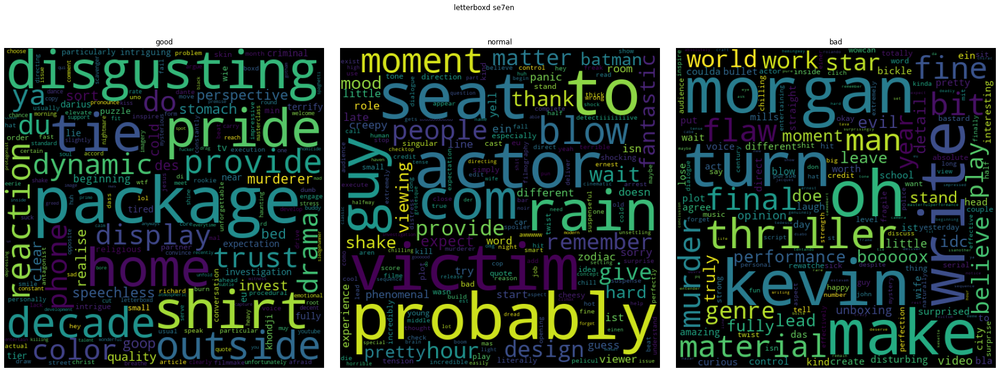

110it [00:01, 59.12it/s]
14it [00:00, 65.48it/s]
13it [00:00, 36.70it/s]


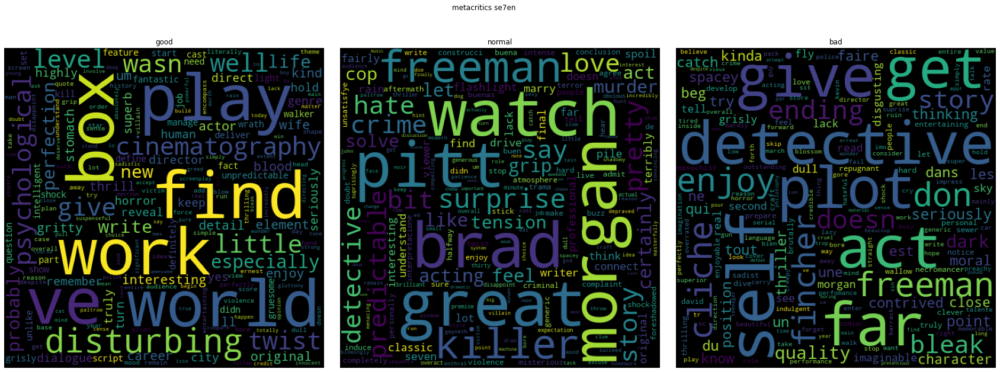

243it [00:08, 28.46it/s]
85it [00:05, 14.62it/s]
133it [00:06, 21.48it/s]


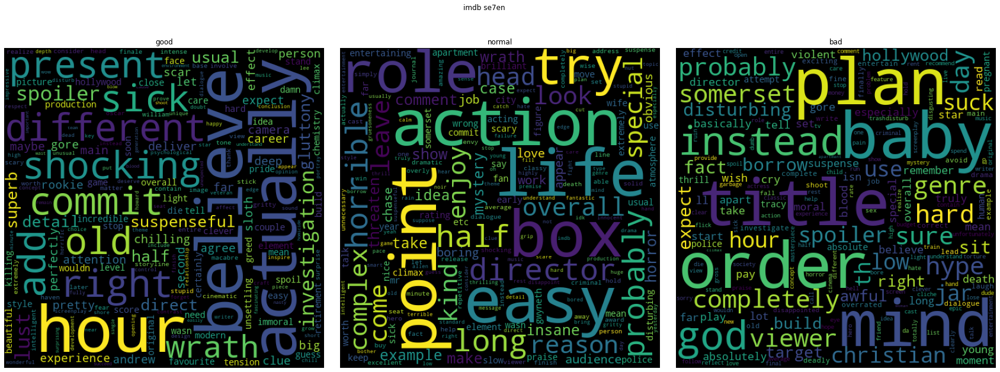

In [ ]:
word_cloud('se7en', n=0.05, good_score=8, bad_score=4)

원래는 tfidf벡터를 사용하려고 했으나, 빈도수를 기준으로 판별할 것이기  때문에 countvectorizer를 사용하는 것이 더 좋을것이다.

## 단어빈도수(term frequency)를 기준으로 histogram도 그려볼 예정입니다.

In [ ]:
import spacy
from tqdm import tqdm
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import re

# metacritics frozen 긍정리뷰로 테스트

In [ ]:
metacritics_frozen = metacritics_df[['frozen', 'frozen_rating']]
metacritics_frozen_good = metacritics_frozen.loc[metacritics_frozen['frozen_rating'] >= 8].dropna()

metacritics_frozen_good

,frozen,frozen_rating
0,Frozen is fantastic. Flawless animation and te...,10.0
1,While we all love Disney and the happiness it ...,10.0
4,I’ve been pretty back and forth between this f...,8.0
5,"I don't care how many times ""Let it Go"" played...",8.0
7,"In a rather weak year for cinema, regardless o...",10.0
...,...,...
344,"""Frozen"" was a very good movie , the story , t...",8.0
349,With sunning animation and likeable characters...,8.0
352,"Just as the answer to ""do you want to build a ...",8.0
358,"The characters are mostly great, the songs are...",9.0


# 전처리(소문자화, 영어만남기기, 토큰화(lemma))

In [ ]:
import re
metacritics_frozen_review_good = metacritics_frozen_good['frozen'].map(str).reset_index(drop = True)
metacritics_frozen_review_good = metacritics_frozen_review_good.apply(lambda x : re.sub('[^a-zA-Z]', " ", x))
metacritics_frozen_review_good_lower = [review.lower() for review in metacritics_frozen_review_good]

metacritics_frozen_review_good_lower[:2]

['frozen is fantastic  flawless animation and terrific songs combine to make it the best disney movie in a decade  as well as one of the funniest  this is one i will watch over and over ',
 'while we all love disney and the happiness it brings to everyone  sometimes it over shows ideals to young girls that might not come true in reality   frozen  addresses the meaning of love right from the start  with an adult anna  who  being separated from reality for her entire life  has no idea what love truly means   as an avid disney fan  and as someone with two sisters  this is a movie that people of all ages will love to see ']

In [ ]:
%time # 시간 재주기
from tqdm import tqdm

# spacy사용
import spacy
nlp = spacy.load('en_core_web_sm')

reviews_lemmatized = []  # [[리뷰1단어, 리뷰1단어, ..], [리뷰2단어, 리뷰2단어...], [], ...[]]

for review in tqdm(nlp.pipe(metacritics_frozen_review_good_lower)):
  lemmatized_tokens = [token.lemma_ for token in review if not token.is_punct and not token.is_space and not token.is_stop]
                                                                  # is_punct 특수기호,  is_space 공백, is_stop 불용어처리
  reviews_lemmatized.append(lemmatized_tokens)


metacritics_frozen_good['review tokenized'] = [' '.join(words) for words in reviews_lemmatized]

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 8.82 µs


199it [00:04, 46.40it/s]


In [ ]:
metacritics_frozen_good

,frozen,frozen_rating,review tokenized
0,Frozen is fantastic. Flawless animation and te...,10.0,freeze fantastic flawless animation terrific s...
1,While we all love Disney and the happiness it ...,10.0,love disney happiness bring show ideal young g...
4,I’ve been pretty back and forth between this f...,8.0,ve pretty forth film release find annoying tee...
5,"I don't care how many times ""Let it Go"" played...",8.0,don t care time let play radio turn
7,"In a rather weak year for cinema, regardless o...",10.0,weak year cinema regardless genre easily brigh...
...,...,...,...
344,"""Frozen"" was a very good movie , the story , t...",8.0,frozen good movie story character song let cha...
349,With sunning animation and likeable characters...,8.0,sunning animation likeable character frozen di...
352,"Just as the answer to ""do you want to build a ...",8.0,answer want build snowman sure get musical phe...
358,"The characters are mostly great, the songs are...",9.0,character great song catchy emotional animatio...


## count vector화

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cnt_vectorizer = CountVectorizer()

cnt = cnt_vectorizer.fit(metacritics_frozen_good['review tokenized'])

cnt_scores = cnt.transform(metacritics_frozen_good['review tokenized'])

cnt_scores

<199x2200 sparse matrix of type '<class 'numpy.int64'>'
	with 7901 stored elements in Compressed Sparse Row format>

## count vector의 단어집합 생성

In [ ]:
cnt.vocabulary_

{'freeze': 801,
 'fantastic': 720,
 'flawless': 770,
 'animation': 85,
 'terrific': 1947,
 'song': 1800,
 'combine': 356,
 'good': 850,
 'disney': 541,
 'movie': 1283,
 'decade': 477,
 'funniest': 815,
 'watch': 2131,
 'love': 1180,
 'happiness': 899,
 'bring': 236,
 'show': 1737,
 'ideal': 985,
 'young': 2195,
 'girl': 840,
 'come': 357,
 'true': 2022,
 'reality': 1558,
 'frozen': 810,
 'address': 32,
 'meaning': 1225,
 'right': 1638,
 'start': 1841,
 'adult': 42,
 'anna': 87,
 'separate': 1709,
 'entire': 633,
 'life': 1140,
 'idea': 984,
 'truly': 2023,
 'mean': 1224,
 'avid': 147,
 'fan': 718,
 'sister': 1767,
 'people': 1412,
 'age': 53,
 've': 2092,
 'pretty': 1484,
 'forth': 795,
 'film': 756,
 'release': 1594,
 'find': 760,
 'annoying': 88,
 'teenager': 1936,
 'begin': 182,
 'appreciate': 103,
 'time': 1974,
 'go': 847,
 'unfortunately': 2055,
 'feel': 742,
 'clich': 335,
 'standard': 1837,
 'affair': 49,
 'certainly': 287,
 'engineer': 621,
 'era': 642,
 'say': 1675,
 'work': 

In [ ]:
cnt.vocabulary_.items()

dict_items([('freeze', 801), ('fantastic', 720), ('flawless', 770), ('animation', 85), ('terrific', 1947), ('song', 1800), ('combine', 356), ('good', 850), ('disney', 541), ('movie', 1283), ('decade', 477), ('funniest', 815), ('watch', 2131), ('love', 1180), ('happiness', 899), ('bring', 236), ('show', 1737), ('ideal', 985), ('young', 2195), ('girl', 840), ('come', 357), ('true', 2022), ('reality', 1558), ('frozen', 810), ('address', 32), ('meaning', 1225), ('right', 1638), ('start', 1841), ('adult', 42), ('anna', 87), ('separate', 1709), ('entire', 633), ('life', 1140), ('idea', 984), ('truly', 2023), ('mean', 1224), ('avid', 147), ('fan', 718), ('sister', 1767), ('people', 1412), ('age', 53), ('ve', 2092), ('pretty', 1484), ('forth', 795), ('film', 756), ('release', 1594), ('find', 760), ('annoying', 88), ('teenager', 1936), ('begin', 182), ('appreciate', 103), ('time', 1974), ('go', 847), ('unfortunately', 2055), ('feel', 742), ('clich', 335), ('standard', 1837), ('affair', 49), ('c

In [ ]:
vocabs = sorted(cnt.vocabulary_.items())
vocabs

[('ability', 0),
 ('able', 1),
 ('abruptly', 2),
 ('absence', 3),
 ('absolute', 4),
 ('absolutely', 5),
 ('absolutley', 6),
 ('absorb', 7),
 ('absorbing', 8),
 ('absurd', 9),
 ('academy', 10),
 ('accentuate', 11),
 ('accept', 12),
 ('acceptance', 13),
 ('accident', 14),
 ('accidentally', 15),
 ('accompany', 16),
 ('ache', 17),
 ('achieve', 18),
 ('achievement', 19),
 ('acknowledge', 20),
 ('act', 21),
 ('acting', 22),
 ('action', 23),
 ('actor', 24),
 ('actually', 25),
 ('adam', 26),
 ('adapt', 27),
 ('adaptation', 28),
 ('add', 29),
 ('addict', 30),
 ('addition', 31),
 ('address', 32),
 ('adjust', 33),
 ('admirable', 34),
 ('admire', 35),
 ('admit', 36),
 ('adoptive', 37),
 ('adorable', 38),
 ('adorableness', 39),
 ('adore', 40),
 ('adorer', 41),
 ('adult', 42),
 ('advance', 43),
 ('advantage', 44),
 ('adventure', 45),
 ('adventurous', 46),
 ('advertisement', 47),
 ('aesthetic', 48),
 ('affair', 49),
 ('affect', 50),
 ('affectionate', 51),
 ('afraid', 52),
 ('age', 53),
 ('ageless', 5

In [ ]:
vocabs = [item[0] for item in vocabs]
vocabs

['ability',
 'able',
 'abruptly',
 'absence',
 'absolute',
 'absolutely',
 'absolutley',
 'absorb',
 'absorbing',
 'absurd',
 'academy',
 'accentuate',
 'accept',
 'acceptance',
 'accident',
 'accidentally',
 'accompany',
 'ache',
 'achieve',
 'achievement',
 'acknowledge',
 'act',
 'acting',
 'action',
 'actor',
 'actually',
 'adam',
 'adapt',
 'adaptation',
 'add',
 'addict',
 'addition',
 'address',
 'adjust',
 'admirable',
 'admire',
 'admit',
 'adoptive',
 'adorable',
 'adorableness',
 'adore',
 'adorer',
 'adult',
 'advance',
 'advantage',
 'adventure',
 'adventurous',
 'advertisement',
 'aesthetic',
 'affair',
 'affect',
 'affectionate',
 'afraid',
 'age',
 'ageless',
 'ago',
 'agree',
 'ahead',
 'air',
 'aladdin',
 'alan',
 'albeit',
 'album',
 'algumas',
 'align',
 'alike',
 'alive',
 'allow',
 'alot',
 'alright',
 'alter',
 'alternate',
 'amazing',
 'amazingly',
 'ambiguous',
 'ambitious',
 'amount',
 'amy',
 'ana',
 'andersen',
 'anderson',
 'angle',
 'animal',
 'animate',
 

In [ ]:
cnt_scores.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
import pandas as pd

dtm = pd.DataFrame(
    columns=vocabs,
    data=cnt_scores.toarray())

dtm

,ability,able,abruptly,absence,absolute,absolutely,absolutley,absorb,absorbing,absurd,...,wrong,yeah,year,yell,yes,young,youtube,zap,zenith,zero
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dtm.sum(axis=0)

ability      2
able        10
abruptly     1
absence      1
absolute     2
            ..
young       13
youtube      3
zap          1
zenith       1
zero         1
Length: 2200, dtype: int64

In [ ]:
dtm_sum = dtm.sum(axis=0).to_frame()
dtm_sum = dtm_sum.sort_values(by=0).reset_index()
dtm_sum

,index,0
0,zero,1
1,glory,1
2,globe,1
3,glitter,1
4,gladly,1
...,...,...
2195,character,151
2196,film,165
2197,good,232
2198,disney,240


In [ ]:
dtm_sum = dtm_sum.rename(columns = {'index': 'word',
                          0 : 'count'})
dtm_sum

,word,count
0,zero,1
1,glory,1
2,globe,1
3,glitter,1
4,gladly,1
...,...,...
2195,character,151
2196,film,165
2197,good,232
2198,disney,240


# 히스토그램으로 빈도수 시각화

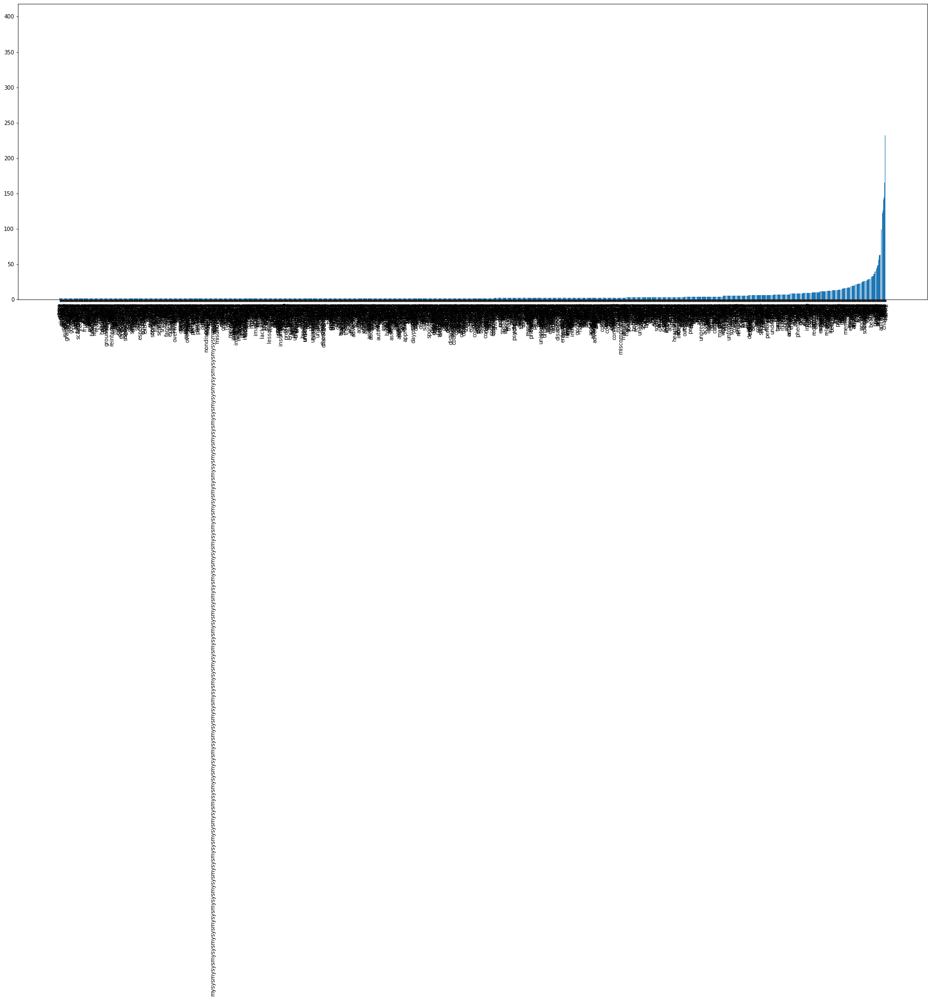

In [ ]:
plt.figure(figsize=(30,10))
plt.bar(dtm_sum['word'], dtm_sum['count'])
plt.xticks(rotation=90)
plt.show()

In [ ]:
dtm['mysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysysmysys'].sum(axis=0)

1

위와같이 의미없는 단어들이 있어서 빈도수 1인것은 모두 삭제하기로 하였습니다.

In [ ]:
dtm_sum = dtm_sum.loc[dtm_sum['count'] != 1]
dtm_sum

,word,count
1158,stellar,2
1159,stick,2
1160,showcase,2
1161,spin,2
1162,sky,2
...,...,...
2195,character,151
2196,film,165
2197,good,232
2198,disney,240


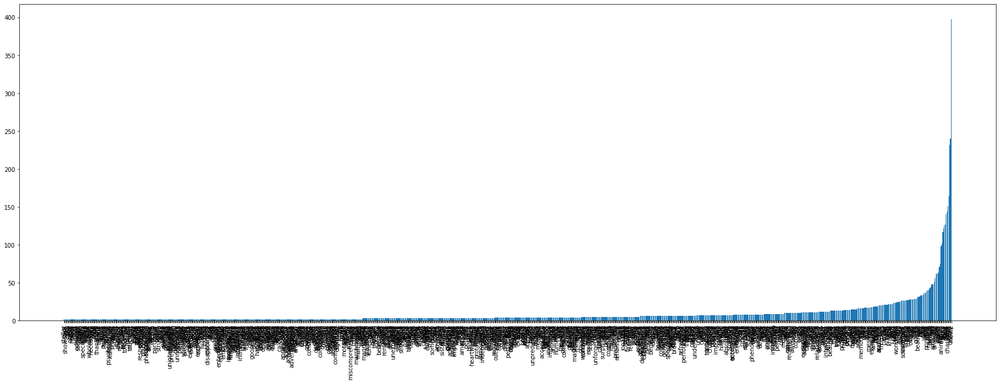

In [ ]:
plt.figure(figsize=(30,10))
plt.bar(dtm_sum['word'], dtm_sum['count'])
plt.xticks(rotation=90)
plt.show()

### 'disney', 'movie', 'song', 'film', 'story', 'character'들이 빈도수 상위 단어였다.

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs


110it [00:03, 29.35it/s]


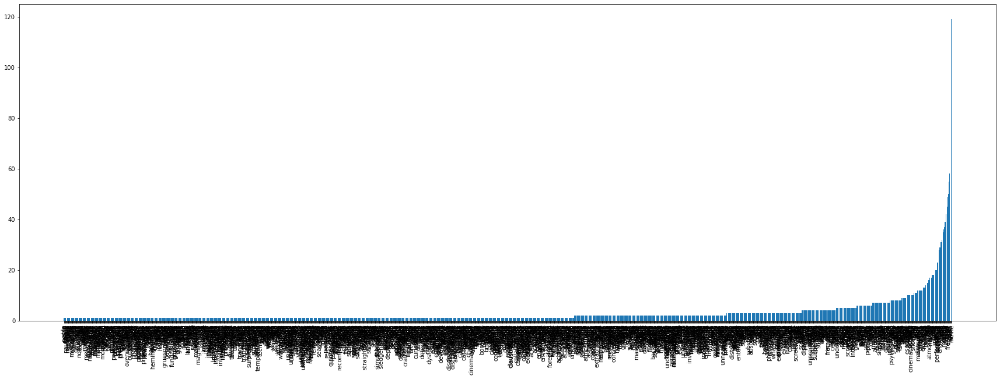

In [ ]:
metacritics_se7en = metacritics_df[['se7en', 'se7en_rating']]
metacritics_se7en_good = metacritics_se7en.loc[metacritics_se7en['se7en_rating'] >= 8].dropna()

import re
metacritics_se7en_review_good = metacritics_se7en_good['se7en'].map(str).reset_index(drop = True)
metacritics_se7en_review_good = metacritics_se7en_review_good.apply(lambda x : re.sub('[^a-zA-Z]', " ", x))
metacritics_se7en_review_good_lower = [review.lower() for review in metacritics_se7en_review_good]


%time
from tqdm import tqdm


import spacy
nlp = spacy.load('en_core_web_sm')

reviews_lemmatized = []  # [[리뷰1단어, 리뷰1단어, ..], [리뷰2단어, 리뷰2단어...], [], ...[]]

for review in tqdm(nlp.pipe(metacritics_se7en_review_good_lower)):
  lemmatized_tokens = [token.lemma_ for token in review if not token.is_punct and not token.is_space and not token.is_stop]
                                                                  # is_punct 특수기호,  is_space 공백, is_stop 불용어처리
  reviews_lemmatized.append(lemmatized_tokens)


metacritics_se7en_good['review tokenized'] = [' '.join(words) for words in reviews_lemmatized]

from sklearn.feature_extraction.text import CountVectorizer

cnt_vectorizer = CountVectorizer()

cnt = cnt_vectorizer.fit(metacritics_se7en_good['review tokenized'])

cnt_scores = cnt.transform(metacritics_se7en_good['review tokenized'])


vocabs = sorted(cnt.vocabulary_.items())
vocabs = [item[0] for item in vocabs]


import pandas as pd

dtm = pd.DataFrame(
    columns=vocabs,
    data=cnt_scores.toarray())


dtm_sum = dtm.sum(axis=0).to_frame()
dtm_sum = dtm_sum.sort_values(by=0).reset_index()
dtm_sum = dtm_sum.rename(columns = {'index': 'word',
                          0 : 'count'})


plt.figure(figsize=(30,10))
plt.bar(dtm_sum['word'], dtm_sum['count'])
plt.xticks(rotation=90)
plt.show()

In [ ]:
dtm_sum

,word,count
0,able,1
1,nesse,1
2,nervio,1
3,nearly,1
4,nauseous,1
...,...,...
1740,great,58
1741,good,66
1742,seven,68
1743,film,114


### 이것도 movie, film이 상위 빈도수 단어들이었다.

# 히스토그램으로 단어 빈도수들을 확인한 결과, movie, film은 모두 영화리뷰라 의미없는 단어일 것 같아서 제거해주기로 하였습니다.

In [ ]:
def word_cloud(title, good_score=8, bad_score=4):
  website = ['letterboxd', 'metacritics', 'imdb']
  
  for i, df in enumerate([letterboxd_df, metacritics_df, imdb_df]):
    data_df = df[[title, title + '_rating']].dropna()

    # good, normal, bad로 데이터프레임 분할
    good = data_df.loc[data_df.iloc[:,1] >= good_score]
    good = good.iloc[:, 0]
    normal = data_df.loc[ (bad_score < data_df.iloc[:,1]) & (data_df.iloc[:,1] < good_score) ]
    normal = normal.iloc[:, 0]
    bad = data_df.loc[data_df.iloc[:,1] <= bad_score]
    bad = bad.iloc[:, 0]

    # wordcloud 만들때 사용할 리스트. wc를 저장할것( wc.generate_from_frequencies(scores) )
    cnt_wc_list = []

    for a in [good, normal, bad]:
      
      # 리뷰데이터 전처리(소문자화, 정규식으로 영어만남기기, spacy로 특수문자, 공백, 불용어제거, lemma추출)
      reviewlist = a.map(str).reset_index(drop = True)
      reviewlist = reviewlist.apply(lambda x : re.sub('[^a-zA-Z]', " ", x))
      reviewlist_lower = [data.lower() for data in reviewlist]

      nlp = spacy.load('en_core_web_sm')

      reviews_lemmatized = []   #  [[리뷰1단어, 리뷰1단어, 리뷰1단어...], [리뷰2단어, 리뷰2단어,...], [],,,]

      for review in tqdm(nlp.pipe(reviewlist_lower)):
        # 리뷰 1개 가져와서 단어로쪼개서 추가하기
        lemmatized_tokens = [token.lemma_ for token in review if not token.is_punct and not token.is_space and not token.is_stop]
        reviews_lemmatized.append(lemmatized_tokens)  # [리뷰1단어, 리뷰1단어, 리뷰1단어...] 가 추가됨

      reviewdata_lemmatized_join = [' '.join(words) for words in reviews_lemmatized]
      # [[리뷰1], [리뷰2], [리뷰3], ...]

      # count벡터화
      cnt = CountVectorizer().fit(reviewdata_lemmatized_join)
  
      cnt_scores = cnt.transform(reviewdata_lemmatized_join)



      # 각 단어별 count점수 딕셔너리 만들기

      scores = {}

      for review, cnt_score in zip(reviews_lemmatized, cnt_scores) : # cnt_socre = (1, vocab_size)  /  cnt_scores = (review개수, vocab size)
                                                                     # review = [리뷰1단어, 리뷰1단어, 리뷰1단어...] 리뷰1개씩 꺼내주기
        for term in review:
          if term in cnt.vocabulary_.keys():
            scores[term] = cnt_score[0, cnt.vocabulary_[str(term).strip()]] + scores.get(term, 0) # 원래값에 플러스해주기!

      # movie, film은 워드클라우드에서 제거
      scores.pop('movie')
      scores.pop('film')


      # wordcloud 생성
      wc = WordCloud(max_font_size=100, width=500, height=500 )
      count_wc = wc.generate_from_frequencies(scores)

      cnt_wc_list.append(count_wc)


    plt.figure(figsize=(30, 10))
    plt.subplots_adjust(wspace=0.05)
    plt.suptitle(website[i] + ' ' + title)

    gnb = ['good', 'normal', 'bad']
    for i, count_wc in enumerate(cnt_wc_list):
      plt.subplot(1, 3, i + 1)
      plt.title(gnb[i])
      plt.imshow(count_wc)
      plt.axis("off")
          
    plt.show()


1971it [00:26, 73.07it/s]
890it [00:12, 74.08it/s]
49it [00:00, 49.15it/s]


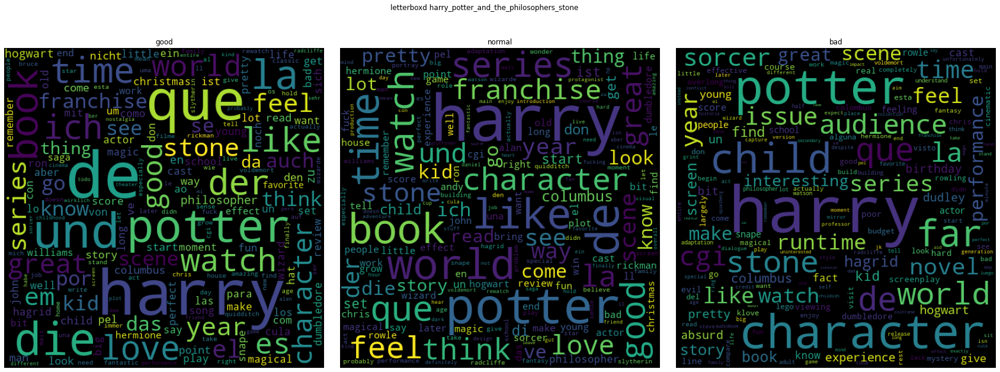

110it [00:01, 76.16it/s]
59it [00:01, 57.41it/s]
12it [00:00, 43.54it/s]


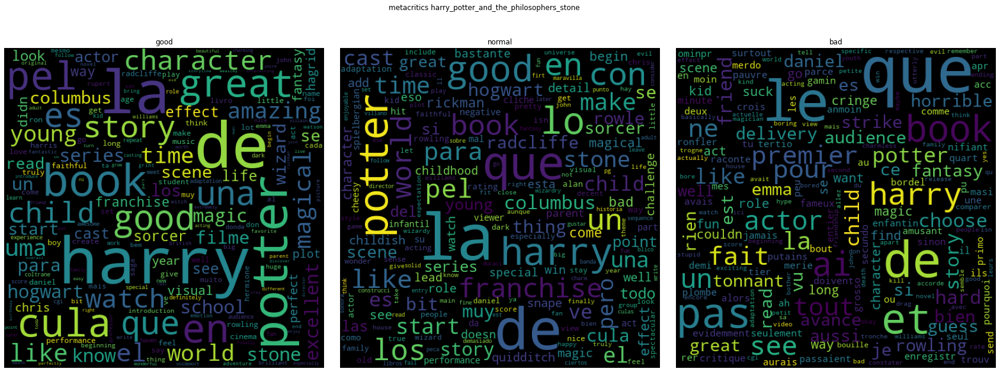

204it [00:08, 23.46it/s]
124it [00:04, 24.92it/s]
133it [00:06, 21.48it/s]


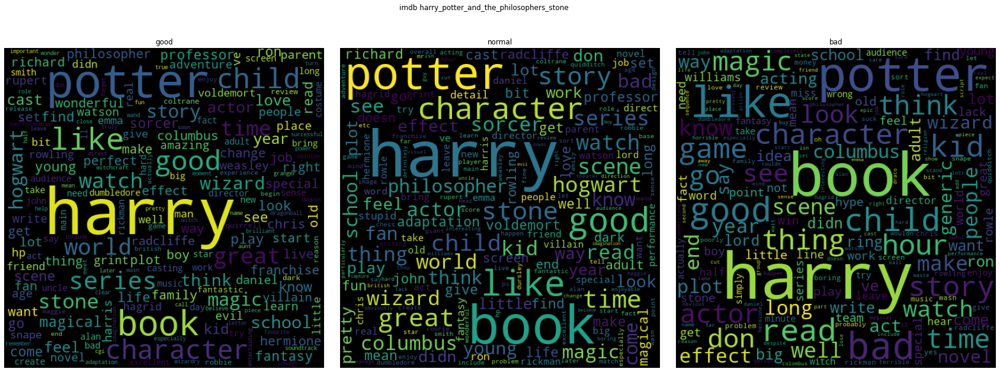

In [ ]:
word_cloud('frozen', good_score=8, bad_score=4)

1971it [00:24, 79.72it/s]
890it [00:15, 57.17it/s]
49it [00:01, 47.55it/s]


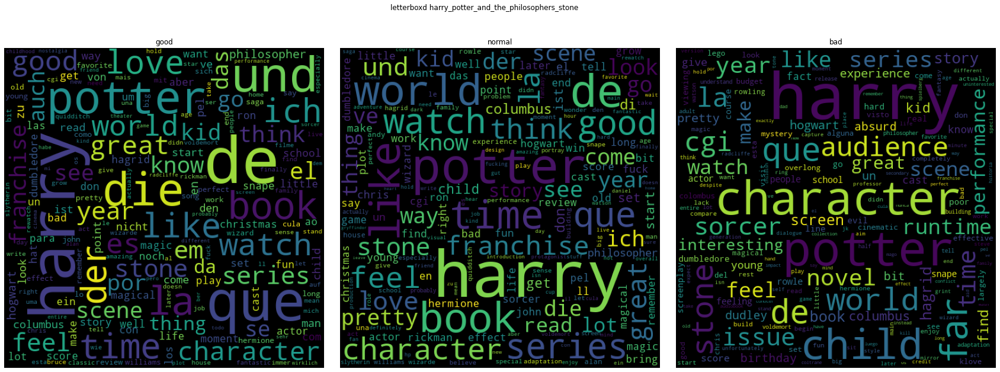

110it [00:01, 76.32it/s]
59it [00:01, 57.68it/s]
12it [00:00, 53.89it/s]


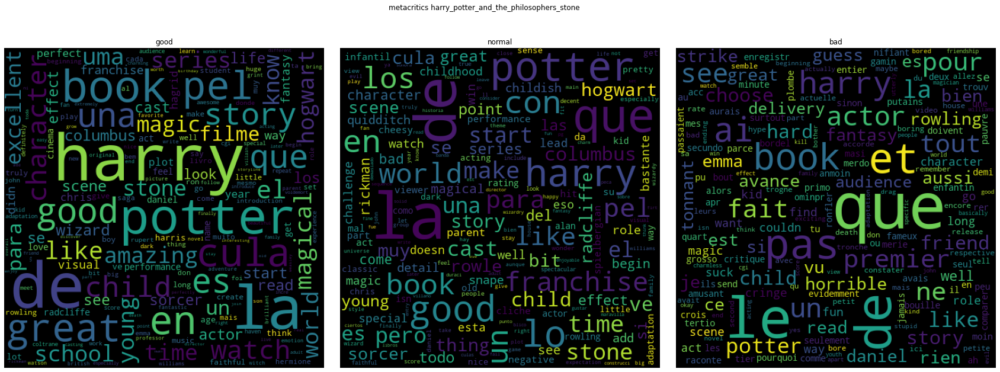

204it [00:06, 31.69it/s]
124it [00:04, 24.93it/s]
133it [00:05, 24.05it/s]


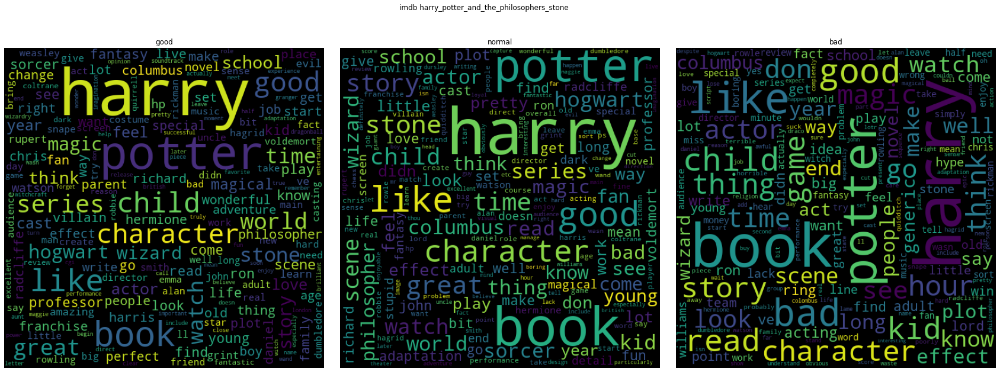

In [ ]:
word_cloud('harry_potter_and_the_philosophers_stone', good_score=8, bad_score=4)

ex) harry potter의 결과의 경우 bad리뷰임에도 불구하고 good이나 like가 빈도가 높다.

전반적인 관객들의 반응들을 한눈에 확인할 수 있다.


- 위와같이 영화에따라 wordcloud를 생성하면 keyword분석이 가능하다.
이러한 keyword들은 마케팅에서 이용될 수 있다. 좋은 리뷰의 keyword를 분석하여 마케팅에 이용.

  - 반응이 좋았던 영화들의 keyword를 분석해서 오리지날 컨텐츠 제작에 참고해도 좋을 것이다.

같은 영화지만 사이트별로 반응이 다를수도있다. 이러한 고객들의 반응을 실시간으로 모니터링 해야한다.
작품의 영향력이 고객 수 증가에도 중대한 영향을 미칠 것이기 때문에 ‘Trend 추세를 빠르게 파악’하여 방향성을 제고해야 한다.

# 기간별(month) trend keyword 뽑기
- lettorboxd popular reviews를 시간별로 크롤링해 그 달의 keyword 분석!



In [ ]:
import requests
from fake_useragent import UserAgent
from bs4 import BeautifulSoup
import re
import pandas as pd

titles = []
days = []
reviews = []


for pg in range(1, 257):
  
  url = "https://letterboxd.com/reviews/popular/page/{}/".format(pg)
  headers = {"user-agent": UserAgent().chrome}
  response = requests.get(url, headers=headers)
  page = response.content
  soup = BeautifulSoup(page, 'html.parser')

  # title크롤링
  div_list = soup.select("div.film-detail-content > h2 > a")
  for div in div_list:
    titles.append(div.text)


  # day 크롤링
  day_list = soup.select("._nobr")
  i = 0

  for day in day_list:
    if day.text == '':
      days.append(soup.select("._nobr > .localtime-d-mmm-yyyy")[i].get('datetime'))
      i += 1
    else:
      days.append(day.text)


  # review 크롤링
  # 긴 리뷰들은 more(더보기)로 숨겨져있었기 때문에, 그것들을 펼쳐주고자 url을 다시한번 정리
  url_list = []
  div_list = soup.select("div.body-text.-prose.collapsible-text")
  for div in div_list:
      url = div.get('data-full-text-url')
      url_list.append(url)

  
  for i in url_list:
      url = 'https://letterboxd.com' + i
      headers = {"user-agent": UserAgent().chrome}
      response = requests.get(url, headers=headers)
      page = response.content
      soup = BeautifulSoup(page, 'html.parser')
      reviews.append(soup.text.strip())

In [ ]:
len(titles)

4608

In [ ]:
len(days)

4608

In [ ]:
len(reviews)

4608

In [ ]:
titles

["Don't Look Up",
 'Fight Club',
 'The Batman',
 'Everything Everywhere All at Once',
 'Dune',
 'Joker',
 'Spider-Man: No Way Home',
 'Everything Everywhere All at Once',
 "Don't Worry Darling",
 'The Batman',
 "Don't Worry Darling",
 'Tenet',
 'Joker',
 'Glass Onion: A Knives Out Mystery',
 'Barbarian',
 'Pearl',
 'Thor: Love and Thunder',
 'Parasite',
 'Nope',
 'Dune',
 'Morbius',
 'Parasite',
 'The Batman',
 'The Lighthouse',
 'Spider-Man: No Way Home',
 'Nope',
 'Midsommar',
 'Glass Onion: A Knives Out Mystery',
 'The Power of the Dog',
 'Nope',
 'Little Women',
 'Luca',
 "Don't Worry Darling",
 'Turning Red',
 'Spencer',
 'Doctor Strange in the Multiverse of Madness',
 'The Batman',
 'The Florida Project',
 'Everything Everywhere All at Once',
 'The Northman',
 'Shang-Chi and the Legend of the Ten Rings',
 "Don't Worry Darling",
 'X',
 'Men',
 'Everything Everywhere All at Once',
 'American Psycho',
 'Jojo Rabbit',
 'Elvis',
 'Encanto',
 'The Northman',
 'The Worst Person in the W

In [ ]:
Day = []
cnt = 0
for day in days:
  if day[-1] == 'Z':
    y = day[:4]
    m = day[5:7]
    d = day[8:10]
    Day.append(d +" " +m + " " + y)
    cnt += 1
  else:
    Day.append(day)

In [ ]:
cnt

248

In [ ]:
top_review_df = pd.DataFrame(
    {"day" : Day,
    "title" : titles,
     "review" : reviews} 
)

top_review_df

,day,title,review
0,24 Dec 2021,Don't Look Up,oscar-worthy performance by leo pretending to ...
1,18 Feb 2018,Fight Club,first watch: fight club is the best movie ever...
2,02 Mar 2022,The Batman,I just love how fucking disgusting Bruce looks...
3,24 Mar 2022,Everything Everywhere All at Once,this is one of the best things iâ€™ve ever see...
4,21 Oct 2021,Dune,how you gonna birth the chosen one with unlimi...
...,...,...,...
4603,17 May 2021,Those Who Wish Me Dead,They used to make like 15 of these a year and ...
4604,23 Oct 2021,Mad God,commits to the bit at an inspiring level
4605,01 Sep 2020,Spree,The screen movie concept finally doesn’t feel ...
4606,10 Oct 2019,No Country for Old Men,nothing is scarier than being chased by javier...


In [ ]:
top_review_df.to_csv('popular_reviews')

In [ ]:
top_review_df['day'] =  top_review_df['day'].replace(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                                                    ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10','11', '12'], regex=True)

In [ ]:
top_review_df['day']

0       24 12 2021
1       18 02 2018
2       02 03 2022
3       24 03 2022
4       21 10 2021
           ...    
4603    17 05 2021
4604    23 10 2021
4605    01 09 2020
4606    10 10 2019
4607    28 05 2018
Name: day, Length: 4608, dtype: object

In [ ]:
top_review_df['y-m'] = top_review_df['day'].apply(lambda x : x[6:]+"-"+x[3:5])
top_review_df['y-m']

0       2021-12
1       2018-02
2       2022-03
3       2022-03
4       2021-10
         ...   
4603    2021-05
4604    2021-10
4605    2020-09
4606    2019-10
4607    2018-05
Name: y-m, Length: 4608, dtype: object

In [ ]:
top_review_df

,day,title,review,y-m
0,24 12 2021,Don't Look Up,oscar-worthy performance by leo pretending to ...,2021-12
1,18 02 2018,Fight Club,first watch: fight club is the best movie ever...,2018-02
2,02 03 2022,The Batman,I just love how fucking disgusting Bruce looks...,2022-03
3,24 03 2022,Everything Everywhere All at Once,this is one of the best things iâ€™ve ever see...,2022-03
4,21 10 2021,Dune,how you gonna birth the chosen one with unlimi...,2021-10
...,...,...,...,...
4603,17 05 2021,Those Who Wish Me Dead,They used to make like 15 of these a year and ...,2021-05
4604,23 10 2021,Mad God,commits to the bit at an inspiring level,2021-10
4605,01 09 2020,Spree,The screen movie concept finally doesn’t feel ...,2020-09
4606,10 10 2019,No Country for Old Men,nothing is scarier than being chased by javier...,2019-10


# 2022 계절별로 keyword찾기
- spring 3,4,5월 리뷰
- summer 6,7,8
- fall 9,10,11
- winter 12,1,2

In [ ]:
review_spring= top_review_df.loc[top_review_df['y-m'].isin(['2022-03','2022-04','2022-05']) , 'review']
review_spring

2       I just love how fucking disgusting Bruce looks...
3       this is one of the best things iâ€™ve ever see...
7              easily one of the top 5 movies about taxes
9       There’s a lot of talk about how this is the se...
20      jared leto is like king midas except everythin...
                              ...                        
4483    THE INSIDE CINEMATIC UNIVERSE (ICU) SCHEDULE:2...
4486    Missed opportunity for an army of me by bjÃ¶rk...
4520    Oscar isaac blink three times if you are being...
4529    men be like being a woman seems hard. I should...
4531    95Maybe could've used a bit of a trim, but whe...
Name: review, Length: 285, dtype: object

In [ ]:
review_summer= top_review_df.loc[top_review_df['y-m'].isin(['2022-06','2022-07','2022-08']) , 'review']
review_summer

13      calling it glass onion is such a coward's way ...
16      Great first draft! Excited to see when itâ€™s ...
18      this movie does for cloud spotting what jawsÂ ...
25                             this is my ‘don’t look up’
29      Giant gaping butthole in the sky eats Californ...
                              ...                        
4491    Minions: The Rise of Gru is the cinematic equi...
4515          This is the greatest movie I have ever seen
4519    me and ester have a lot in common because we l...
4530    For what its worth, I would love to have Valka...
4592    Austin Butler is really about to be the first ...
Name: review, Length: 235, dtype: object

In [ ]:
review_fall= top_review_df.loc[top_review_df['y-m'].isin(['2022-09','2022-10','2022-11']) , 'review']
review_fall

8       my favorite thing about the movie is that it f...
10      Movie about the dangers of letting men have an...
14             you canâ€™t spell barbarian without airbnb
15      the director yelled “cut!” but mia goth heard ...
27      the biggest mystery to hit the greek islands s...
                              ...                        
4538                     When the mommy kink goes too far
4545            “She’s going to smile” - kid at screening
4549    “In order to fill the Fair Exchange time slot,...
4576            if succession was set in a giant saw trap
4590    yet another groundbreaking performance from ry...
Name: review, Length: 317, dtype: object

In [ ]:
review_winter= top_review_df.loc[top_review_df['y-m'].isin(['2021-12','2022-01','2022-02']) , 'review']
review_winter

0       oscar-worthy performance by leo pretending to ...
6       Never in a million years would I have predicte...
22      The movie version of the "men will literally X...
24      Kevin Feige finally realized they’re never goi...
28      the masculine urge to cope with your step-uncl...
                              ...                        
4464    SCREAM surpassed all of my expectations. Such ...
4532    There are not one, but TWO scenes of straight ...
4556    Okay I watched it. And it’s fucking lame. I ca...
4561                I’m in this photo and i don’t like it
4573    That Bronco Henry bussy got me acting strange....
Name: review, Length: 255, dtype: object

# 위에서했던 전처리(렘마, 소문자...영어남기기)해주고 tfidf로 벡터화해서 단어점수보기 해서 워드클라우드

> 계절별로 keyword확인가능
시간남으면 월별로, 년별로도 해보기